# Лабораторная работа 3: Машина опорных векторов (SVM)

<img src="svm_img.png" width=350>

Результат лабораторной работы — **отчет** в формате ноутбуков IPython (ipynb-файл). Нам не интересен ваш код. Чем меньше кода, тем лучше всем: нам — меньше проверять, вам — проще найти ошибку или дополнить эксперимент.

Постарайтесь сделать ваш отчет интересным рассказом, последовательно отвечающим на вопросы из заданий. Ответы на вопросы должны быть полными, четкими и хорошо аргументированными.

## 1. Квадратичное программирование и QP-солвер

Квадратичное программирование (QP) — специальный тип задач математической оптимизации, заключающийся в нахождении точки минимума неотрицательно-определенной квадратичной формы (многомерная парабола) в присутствии линейных ограничений:
$$
\begin{gather}
    \frac{1}{2}\boldsymbol x^T\boldsymbol P\boldsymbol x + \boldsymbol q^T\boldsymbol x \to \min_{\boldsymbol x} \\
    \begin{aligned}
        \text{s.t.} \quad & \boldsymbol G\boldsymbol x \le \boldsymbol h \\
        & \boldsymbol A\boldsymbol x = \boldsymbol b
    \end{aligned}
\end{gather}
$$

Здесь $\boldsymbol P$ — симметричная матрица. В ограничениях $\boldsymbol G\boldsymbol x \le \boldsymbol h$ и $\boldsymbol A\boldsymbol x = \boldsymbol b$ под знаками равенства и неравенства подразумевается сравнение всех компонент векторов.

Задача квадратичного программирования хорошо изучена, существуют эффективные алгоритмы для ее решения. Имеется множество библиотек с солверами для задачи QP, вот некоторые из них:
 - [CVXOPT](http://cvxopt.org/) (свободно-распространяемая, Python) **рекомендуется к использованию**
 - [Mosek](https://www.mosek.com/) (коммерческая с возможностью получения академической лицензии, C, Java, MATLAB, .NET, R, Python)
 - [Matlab Optimization Toolbox](http://www.mathworks.com/help/optim/ug/quadprog.html) 

#### Задание

1. Установите QP-солвер, разберитесь с его интерфейсом.
2. Протестируйте солвер, решив простую задачу оптимизации в двумерном пространстве:
$$f(\boldsymbol x) = -8x_1 - 16x_2 + x_1^2 + 4x_2^2, \quad \text{s.t.:} \; x_1 + x_2 \leq 5, \; 0 \leq x_1 \leq 3, \; x_2 \geq 0$$
3. Какие из ограничений-неравенств задачи являются _активными_, т.е. влияют на точку оптимума, а какие ограничения можно выбросить и точка оптимума не поменяется?

In [5]:
import numpy as np
from cvxopt import matrix
from cvxopt import solvers
from sklearn.datasets import make_classification
import matplotlib.pyplot as plt

In [7]:
P = matrix(np.diag([2., 8.]))
q = matrix(np.array([-8., -16.]))
G = matrix(np.array([[1., 1.], [1., 0.], [-1., 0.], [0., -1.]]))
h = matrix(np.array([5., 3., 0., 0.]))

sol = solvers.qp(P, q, G, h)
print(sol['x'])

     pcost       dcost       gap    pres   dres
 0: -3.0512e+01 -3.8829e+01  8e+00  0e+00  2e-01
 1: -3.0792e+01 -3.1146e+01  4e-01  2e-16  5e-03
 2: -3.0982e+01 -3.1024e+01  4e-02  2e-16  4e-04
 3: -3.0997e+01 -3.1003e+01  6e-03  9e-17  4e-17
 4: -3.1000e+01 -3.1000e+01  7e-04  2e-16  5e-18
 5: -3.1000e+01 -3.1000e+01  1e-04  2e-16  3e-17
 6: -3.1000e+01 -3.1000e+01  1e-05  2e-16  3e-17
Optimal solution found.
[ 3.00e+00]
[ 2.00e+00]



Задача №2 состоит в анализе всех ограничений-неравенств с целью определить, какие из них можно исключить, при этом сохраняя неизменной точку оптимума.

Проверка неравенства №1 заключается в рассмотрении возможности удаления данного условия.

$$ x_1 + x_2 \leq 5 $$

In [8]:
P = matrix(np.diag([2., 8.]))
q = matrix(np.array([-8., -16.]))
G = matrix(np.array([[1., 0.], [-1., 0.], [0., -1.]]))
h = matrix(np.array([3., 0., 0.]))

sol = solvers.qp(P, q, G, h)
print(sol['x'])

     pcost       dcost       gap    pres   dres
 0: -3.0240e+01 -3.7371e+01  7e+00  0e+00  2e-01
 1: -3.0901e+01 -3.1124e+01  2e-01  1e-16  5e-03
 2: -3.0999e+01 -3.1001e+01  3e-03  7e-17  6e-05
 3: -3.1000e+01 -3.1000e+01  3e-05  0e+00  6e-07
 4: -3.1000e+01 -3.1000e+01  3e-07  2e-16  6e-09
Optimal solution found.
[ 3.00e+00]
[ 2.00e+00]



Проверка неравенства №2 заключается в рассмотрении возможности удаления данного условия.

$$ x_1 \leq 3 $$

In [11]:
P = matrix(np.diag([2., 8.]))
q = matrix(np.array([-8., -16.]))
G = matrix(np.array([[1., 1.], [-1., 0.], [0., -1.]]))
h = matrix(np.array([5., 0., 0.]))

sol = solvers.qp(P, q, G, h)
print(sol['x'])

     pcost       dcost       gap    pres   dres
 0: -3.0419e+01 -3.8120e+01  8e+00  0e+00  2e-16
 1: -3.1027e+01 -3.1339e+01  3e-01  2e-16  4e-17
 2: -3.1196e+01 -3.1201e+01  6e-03  2e-16  2e-17
 3: -3.1200e+01 -3.1200e+01  6e-05  4e-16  2e-17
 4: -3.1200e+01 -3.1200e+01  6e-07  4e-17  5e-17
Optimal solution found.
[ 3.20e+00]
[ 1.80e+00]



Проверка неравенства №3 заключается в рассмотрении возможности удаления данного условия.

$$0 \leq x_1 $$

In [12]:
P = matrix(np.diag([2., 8.]))
q = matrix(np.array([-8., -16.]))
G = matrix(np.array([[1., 1.], [1., 0.], [0., -1.]]),  tc='d')
h = matrix(np.array([5., 3., 0.]),  tc='d')

sol = solvers.qp(P, q, G, h)
print(sol['x'])

     pcost       dcost       gap    pres   dres
 0: -3.1547e+01 -3.0486e+01  1e+01  5e-01  3e-01
 1: -3.0164e+01 -3.1582e+01  1e+00  4e-17  1e-17
 2: -3.0958e+01 -3.1037e+01  8e-02  2e-16  7e-17
 3: -3.0994e+01 -3.1006e+01  1e-02  2e-16  2e-17
 4: -3.0999e+01 -3.1001e+01  2e-03  4e-17  3e-17
 5: -3.1000e+01 -3.1000e+01  2e-04  2e-16  4e-17
 6: -3.1000e+01 -3.1000e+01  3e-05  4e-17  3e-17
 7: -3.1000e+01 -3.1000e+01  4e-06  0e+00  4e-17
Optimal solution found.
[ 3.00e+00]
[ 2.00e+00]



Проверка неравенства №4 заключается в рассмотрении возможности удаления данного условия.

 $$x_2 \geq 0$$

In [13]:
P = matrix(np.diag([2., 8.]))
q = matrix(np.array([-8., -16.]))
G = matrix(np.array([[1., 1.], [1., 0.], [-1., 0.]]))
h = matrix(np.array([5., 3., 0.]))

sol = solvers.qp(P, q, G, h)
print(sol['x'])

     pcost       dcost       gap    pres   dres
 0: -3.0547e+01 -3.4734e+01  4e+00  0e+00  3e-01
 1: -3.0841e+01 -3.1065e+01  2e-01  2e-16  7e-03
 2: -3.0992e+01 -3.1009e+01  2e-02  8e-17  4e-04
 3: -3.0999e+01 -3.1001e+01  2e-03  2e-16  4e-17
 4: -3.1000e+01 -3.1000e+01  3e-04  8e-17  5e-17
 5: -3.1000e+01 -3.1000e+01  4e-05  8e-17  2e-17
 6: -3.1000e+01 -3.1000e+01  6e-06  8e-17  6e-17
Optimal solution found.
[ 3.00e+00]
[ 2.00e+00]



Ответ: В данном случае, условие, которое имеет значение, это...

$$ x_1 \leq 3 $$

Нельзя исключать это условие, поскольку оно оказывает влияние на результат вычислений. Все остальные неравенства-условия можно исключить из этой задачи.

## 2. Линейный SVM

Рассмотрим задачу бинарной классификации. Будем обозначать обучающую выборку $\{(\boldsymbol x_n, y_n)\}_{n=1}^N$, где $N$ — количество объектов, $\boldsymbol x_n \in \mathbb{R}^d$ — числовой вектор признакового описания объекта, $y_n \in \{+1, -1\}$ — класс объекта.

Машина опорных векторов обучает модель разделяющей гиперплоскости:
$$f(\boldsymbol x) = \boldsymbol w^T \boldsymbol x + b$$
Параметры модели — вектор весов $\boldsymbol w \in \mathbb{R}^d$ и сдвиг $b \in \mathbb{R}$.

Обучение модели происходит путем решения оптимизационной задачи:
$$
\begin{gather}
    \frac{1}{2} \| \boldsymbol w \|^2 + C \sum_{n=1}^N \xi_n \to \min_{\boldsymbol w, \boldsymbol \xi, b} \\
    \text{s.t.: } \quad y_n (\boldsymbol w^T \boldsymbol x_n + b) \geq 1 - \xi_n, \quad \xi_n \geq 0, \quad \forall n=1,\dots,N
\end{gather}
$$

Ограничения вида $\quad y_n (\boldsymbol w^T \boldsymbol x_n + b) \geq 1$ требуют, чтобы объекты правильно классифицировались разделяющей гиперплоскостью. Поскольку линейная разделимость выборки не гарантируется на практике, вводят переменные $\xi_n$ (slack variables), которые ослабляют ограничения правильной классификации. В оптимизируемом функционале слагаемое $\| \boldsymbol w \|^2$ штрафует малую ширину разделяющей гиперплоскости, сумма $\sum_n \xi_n$ штрафует ослабление ограничений. 

Гиперпараметр $C$ задает баланс между шириной разделяющей полосы и ошибками, допускаемыми классификатором. Обратите внимание, что $C$ фиксируется до обучения и не оптимизируется вместе с параметрами модели.

Гиперпараметр $C$ отвечает за обобщающую способность разделяющей гиперплоскости, высокая обобщающая способность (соотвествующая большому значению $C$) может привести к переобучению, если линейная модель хорошо описывает обучающие примеры. При подборе оптимального параметра $C$ необходимо оценивать качество на отложенной выборке или кросс-валидации. Как правило, для конкретной задачи заранее неизвестно, какой порядок имеет оптимальное значение гиперпараметра $C$, поэтому перебирать значения лучше по логарифмической сетке, например: $10^{-3}, 10^{-2}, \dots, 10^{5}$.

После нахождения решения оптимизационной задачи $(\boldsymbol w_{\star}, \boldsymbol \xi_{\star}, b_{\star})$, часть ограничений становятся _активными_, т.е. переходят в "крайнее положение" — точное равенство:
$$\quad y_n (\boldsymbol w_{\star}^T \boldsymbol x_n + b_{\star}) = 1 - \xi_{\star,n}$$
Объекты, соответствующие активным ограничениям называются _опорными_.

#### Явное преобразование признаков

Разделяющая гиперплоскость — достаточно грубая модель, редко данные могут быть описаны линейной моделью. Линейная неразделимость векторов может быть исправлена путем перехода в другое признаковое пространство, в котором линейная модель лучше описывает данные и, возможно, существует правильно классифицирующая разделяющая гиперплоскость:

$$\boldsymbol x \in \mathbb{R}^d \mapsto \phi(\boldsymbol x) \in \mathbb{R}^t$$

Так, например, добавление всех попарных произведений признаков: $\phi(x_1, \dots, x_d) = (x_1, \dots, x_d, x_1^2, x_1x_2, \dots, x_d^2)$ переводит в пространство, в котором линейная гиперплоскость является квадратичной формой в исходном пространстве и в исходном пространстве признаков разделяющая поверхность может быть, скажем, эллипсом.

[Видеоролик с демонстрацией](https://youtu.be/9NrALgHFwTo)

#### Задание
  1. Сведите задачу обучения линейного SVM к QP, реализуйте процедуру обучения Линейного SVM при помощи QP-солвера.
  2. Сгенерируйте три случайные двумерные выборки для бинарной классификации:
    - с линейно-разделимыми классами
    - с хорошо разделимыми классами, но не линейно
    - с плохо разделимыми классами по имеющимся признакам
  3. Протестируйте линейный SVM на сгенерированных выборках. Покажите на плоскости разделяющую прямую и линии уровня, ограничивающие коридор $f(\boldsymbol x) = \pm 1$. Выделите опорные вектора точками другой формы или большего размера. Постройте классификаторы с различным значением параметра $C$.
  4. Как зависит число опорных векторов от параметра $C$ для различных выборок?
  5. Используя явное преобразование признаков обучите методом опорных векторов квадратичную разделяющую поверхность. Покажите ее на плоскости.

In [14]:
from sklearn.datasets import make_classification, make_moons, make_circles
from matplotlib import pyplot as plt

In [21]:
from sklearn.base import BaseEstimator
import numpy as np
from cvxopt import matrix, solvers

class LinearSVM(BaseEstimator):
    def __init__(self, C=1, transform=None):
        self.C = C
        self.transform = transform
        
    def fit(self, X, y):
        # Apply transformation if specified
        if self.transform:
            X = self.transform(X.copy())
        
        N, d = X.shape
        
        # Initialize matrices for the quadratic programming problem
        P = np.zeros((N + 1 + d, N + 1 + d))
        P[:d, :d] = np.eye(d)
        q = np.hstack(([0.] * (d + 1), [self.C] * N))
        G1 = np.hstack((-y.reshape(N, 1) * X, -y.reshape(N, 1), -np.eye(N)))
        G2 = np.hstack((np.zeros((N, d + 1)), -np.eye(N)))
        G = np.vstack((G1, G2))
        h = np.hstack(([-1.] * N, [0.] * N)) 
        
        # Solve the quadratic programming problem
        solvers.options['show_progress'] = False
        sol = solvers.qp(matrix(P), matrix(q), matrix(G), matrix(h))
        
        # Extract the coefficients and support vectors
        self.w = np.array(sol['x'][:d]).flatten()
        self.b = float(np.array(sol['x'])[d:d+1].item())
        self.ksi = np.array(sol['x'][d+1:]).flatten()
        
        # Identify support vectors
        self.support_vectors = list()
        self.support_vector_classes = list()
        for i in range(N):
            if (np.absolute(y[i] * (self.w.T.dot(X[i]) + self.b) - 1) < 1e-6) or (self.ksi[i] > 1e-6):
                self.support_vectors.append(X[i])
                self.support_vector_classes.append(y[i])
        self.support_vectors = np.array(self.support_vectors)
        self.support_vector_classes = np.array(self.support_vector_classes)
        
    def predict_proba(self, X):
        # Apply transformation if specified
        if self.transform:
            X = self.transform(X.copy())
        return (np.dot(X, self.w) + self.b).flatten()
            
    def predict(self, X):
        # Apply transformation if specified
        if self.transform:
            X = self.transform(X.copy())
        return np.sign(self.predict_proba(X))


In [25]:
def images_svm(X, y, C, i, j, transform=None):
    # Create a LinearSVM model with specified parameters
    model = LinearSVM(C, transform)
    model.fit(X, y)

    # Scatter plot for data points
    ax[j][i].scatter(X[:, 0], X[:, 1], s=20, c=y, cmap='winter', edgecolor='green')
    
    # Scatter plot for support vectors
    ax[j][i].scatter(model.support_vectors[:, 0], model.support_vectors[:, 1], s=50, marker='o',
                     c=model.support_vector_classes, cmap='winter', edgecolor='green')

    # Set axis limits based on data range
    x1_min = np.min(X[:, 0]) - 1
    x1_max = np.max(X[:, 0]) + 1
    x2_min = np.min(X[:, 1]) - 1
    x2_max = np.max(X[:, 1]) + 1
    
    ax[j][i].set_xlim([x1_min, x1_max])  # Set x-axis limits
    ax[j][i].set_ylim([x2_min, x2_max])  # Set y-axis limits

    # Create a grid of points for plotting decision boundaries
    xvals = np.linspace(x1_min, x1_max, 100)
    yvals = np.linspace(x2_min, x2_max, 100)
    
    xx, yy = np.meshgrid(xvals, yvals)
    zz = np.reshape(model.predict_proba(np.c_[xx.ravel(), yy.ravel()]), xx.shape)
    
    # Plot decision boundaries and color regions
    ax[j][i].pcolormesh(xx, yy, zz, cmap='viridis', zorder=0, shading='auto')
    ax[j][i].contour(xx, yy, zz, colors=["k", "w", "k"], 
                     linestyles=["-", "--", "-"], levels=[-1, 0, 1])
    
    # Display the number of support vectors
    ax[j][i].text(x1_min + 0.5, x2_max - 0.5, ('Number of Support Vectors: ' + str(len(model.support_vectors))))


In [26]:
# Generate three random two-dimensional datasets for binary classification (see Task #2)
import numpy as np
from sklearn.datasets import make_classification, make_moons

# Create empty lists to store the datasets
X = [[]] * 3
y = [[]] * 3

# Generate the first dataset (Linearly separable)
X[0], y[0] = make_classification(
    n_samples=100, n_features=2, n_redundant=0, n_clusters_per_class=1, random_state=50
)

# Generate the second dataset (Non-linearly separable with two clusters per class)
X[1], y[1] = make_classification(
    n_samples=100, n_features=2, n_redundant=0, n_clusters_per_class=2, random_state=2500
)

# Generate the third dataset (Poorly separable) using make_moons
X[2], y[2] = make_moons(n_samples=100, random_state=10000)

# Convert the lists to NumPy arrays
X = np.array(X)
y = np.array(y)

# Define titles for the datasets
titles = ["Linearly Separable", "Non-linearly Separable", "Poorly Separable"]

# Define a range of regularization parameters (C values)
C = 10. ** np.arange(-2, 2)


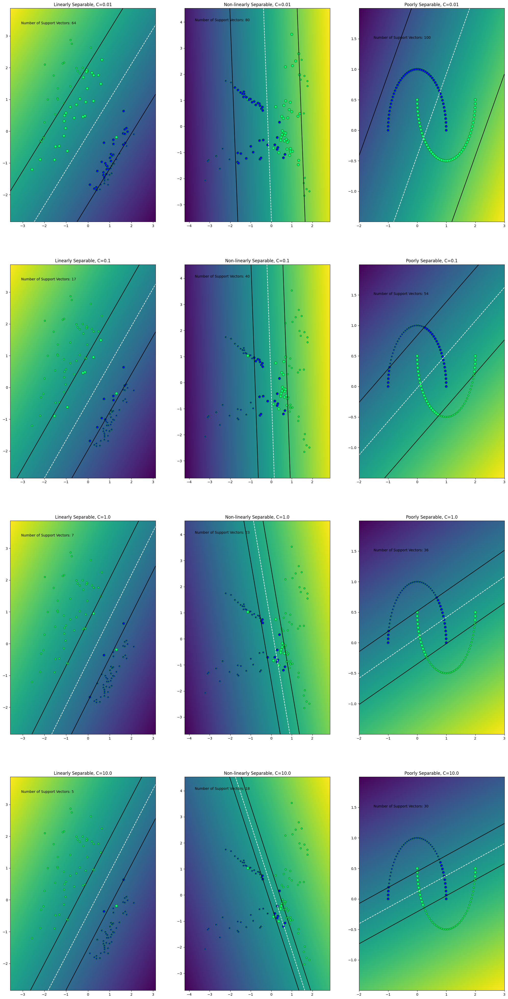

In [27]:
import matplotlib.pyplot as plt

# Create subplots for visualization
fig, ax = plt.subplots(len(C), 3, figsize=(25, 50))

# Loop through the datasets and regularization parameters
for i in range(3):
    # Transform class labels from 0 to -1 for SVM
    y[i][y[i] == 0] = -1
    
    for j in range(len(C)):
        # Call the images_svm function to visualize the SVM model
        images_svm(X[i], y[i], C[j], i, j)
        
        # Set the subplot title
        ax[j][i].set_title(titles[i] + ', C=' + str(C[j]))

# Display the subplots
plt.show()


Вывод: При увеличении значения C количество опорных векторов уменьшается, так как ширина зазора также уменьшается.

In [28]:
def transform(X):
    transformed_X = []  # Initialize an empty list to store the transformed samples

    d = X.shape[1]  # Get the number of features in the dataset

    # Iterate through each sample in the dataset
    for item in X:
        temp = []  # Initialize an empty list to store the transformed features for the current sample

        # Generate all possible pairwise products of features
        for i in range(d):
            for j in range(i, d):
                temp.append(item[i] * item[j])  # Compute the pairwise product and add it to the list

        transformed_X.append(np.array(temp))  # Convert the list to a NumPy array and add it to the transformed data

    # Stack the original features and the transformed features horizontally
    return np.hstack((X, np.array(transformed_X)))

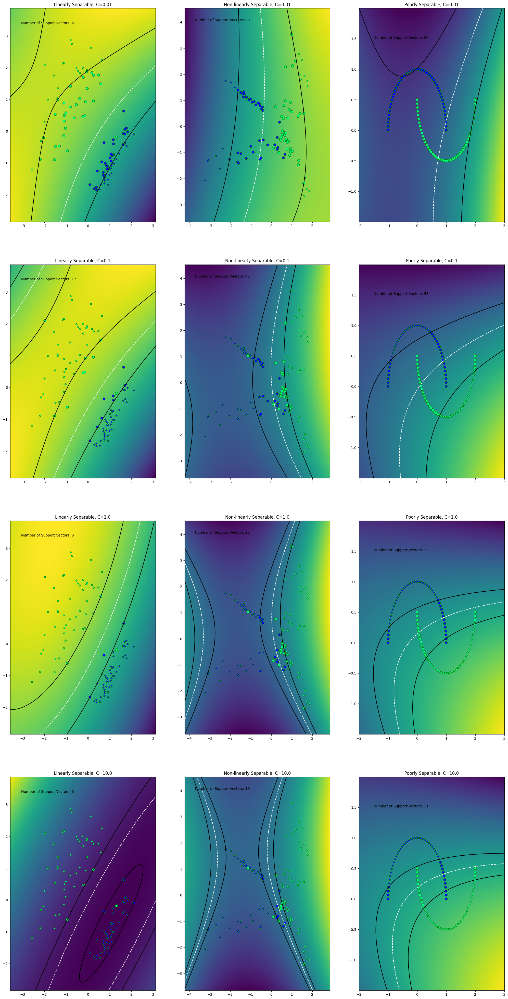

In [29]:
# Create subplots for visualization
fig, ax = plt.subplots(len(C), 3, figsize=(25, 50))

# Loop through the datasets and regularization parameters
for i in range(3):
    # Transform class labels from 0 to -1 for SVM
    y[i][y[i] == 0] = -1
    
    for j in range(len(C)):
        # Call the images_svm function to visualize the SVM model
        # Pass the transform function as an argument to apply feature transformation
        images_svm(X[i], y[i], C[j], i, j, transform=transform)
        
        # Set the subplot title
        ax[j][i].set_title(titles[i] + ', C=' + str(C[j]))

# Display the subplots
plt.show()

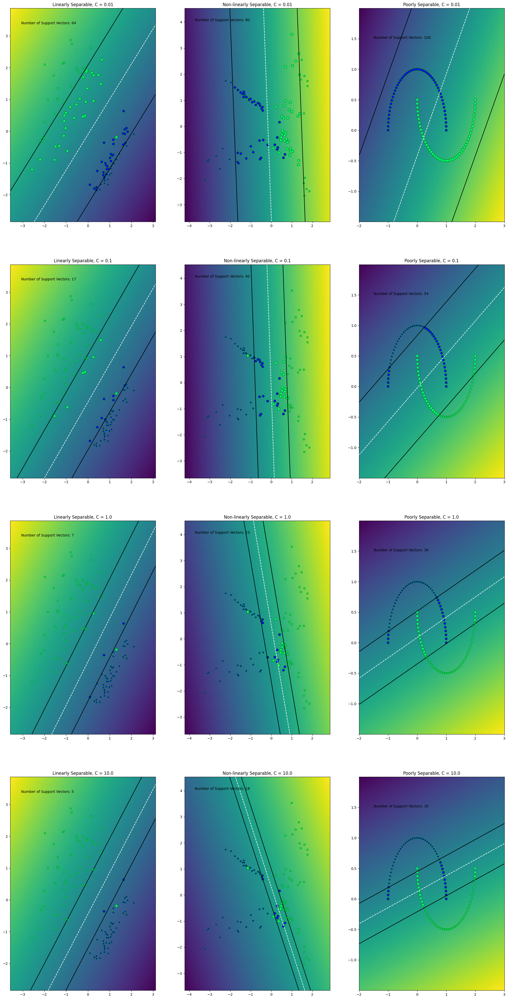

In [30]:
# Create subplots for visualization
fig, ax = plt.subplots(len(C), 3, figsize=(25, 50))

# Loop through the datasets (i) and regularization parameter values (j)
for i in range(3):
    # Transform class labels from 0 to -1 for SVM
    y[i][y[i] == 0] = -1
    
    for j in range(len(C)):
        # Call the images_svm function to visualize the SVM model
        images_svm(X[i], y[i], C[j], i, j)
        
        # Set the subplot title with the dataset name and the current C value
        ax[j][i].set_title(titles[i] + ', C = ' + str(C[j]))

# Display the subplots
plt.show()

Вывод: Из графиков, представленных выше, видно, что среди трех случайно сгенерированных двумерных выборок для бинарной классификации (с линейно-разделимыми классами, с нелинейно-разделимыми классами и с плохо разделимыми классами) наилучшую обучаемость демонстрирует первая выборка.

# 3. Двойственный переход и Ядровой SVM

Задачу обучения линейного SVM, рассмотренную в предыдущем пункте принято называть _прямой_ оптимизационной задачей для SVM. Любая задача оптимизации с ограничениями имеет [_двойственную_ задачу Лагранжа](http://goo.gl/OujTPr), в которой оптимизируются _двойственные переменные_ (множители Лагранжа), соответствующие штрафу за нарушение ограничений, максимизируется нижняя оценка функционала прямой задачи. В случае задачи квадратичного программирования, решение двойственной задачи (значение оптимизируемого функционала) совпадает с оптимумом прямой задачи.

Подробнее можно почитать в [статье](./SMAIS11_SVM.pdf).

Двойственная задача для SVM имеет вид:
$$
\begin{gather}
    \sum_{n} \alpha_n - \frac{1}{2}\sum_{n}\sum_{n'} \alpha_{n}\alpha_{n'} y_{n}y_{n'} x_{n}^Tx_{n'} \to \max_{\alpha} \\
    \begin{aligned}
        \text{s.t. } \quad  
        & 0 \le \alpha_n \le C, \quad \forall n = 1, \dots, N \\
        & \sum_{n} \alpha_n y_n = 0
    \end{aligned}
\end{gather}
$$

Оптимизируется вектор из двойственных переменных $\alpha_n$, соответствующих объектам обучающей выборки. Объект $x_n$ является опорным, если $\alpha_n > 0$.

Предсказание вычисляется по следующему правилу:
$$\hat{y}(x) = \text{sign}\left(\sum_{n}\alpha_{n}y_{n}x^Tx_{n} + b\right).$$

Для предсказания необходимо оценить значение $b$. Известно, что для любого опорного объекта, который классифицируется безошибочно верно:
$$y_n = \sum_{n'}\alpha_{n}y_{n}x_{n}^Tx_{n'} + b,$$
значит для любого такого объекта:
$$b = y_n - \sum_{n'}\alpha_{n}y_{n}x_{n}^Tx_{n'}.$$

В случае наличия ошибок классификации обучающей выборки, предлагается усреднять значение $b$ по всем опорным векторам:
$$b = \frac{1}{N_\text{SV}}\sum_{n \in \text{SV}}\left(y_n - \sum_{n'}\alpha_{n}y_{n}x_{n}^Tx_{n'}\right).$$
Интуиция здесь такова, что суммарные ошибки в положительную сторону примерно равны суммарным ошибкам в отрицательную сторону.

Другой вариант — отказаться от параметра $b$ и работать с моделью $f(x) = w^Tx$, добавив к вектору $x$ константный признак.

#### Неявное преобразование признаков
Отметим, что двойственная задача SVM содержит вектора признаков исключительно в виде скалярного произведения $x^Tx'$. Эта особенность позволяет производить неявное преобразование признакового пространства. Вместо вычисления функции $\phi(\boldsymbol x)$, которая может отображать исходные признаки в вектора очень большой размерности, будем вычислять скалярное произведение $k(\boldsymbol x, \boldsymbol x') = \phi(\boldsymbol x)^T\phi(\boldsymbol x')$ называемое _ядром_. 

#### Задание
  1. Реализуйте процедуру обучения ядрового SVM, используя QP-солвер.
  2. Протестируйте на случайных двумерных выборках ядровой SVM. Покажите на плоскости строящиеся разделяющие поверхности, линии уровня, ограничивающие коридор $f(\boldsymbol x) = \pm 1$. Выделите опорные вектора точками другой формы или большего размера. Попробуйте следующие ядровые функции:
    - линейная: $k(x, x') = x^Tx'$
    - полиномиальная: $k(x, x') = (x^Tx' + 1)^p$ с различными степенями $p = 2,3,\dots$
    - Гауссовская-RBF: $k(x, x') = \exp(-\frac{1}{2\gamma}\|x - x'\|^2)$
  3. Как ведет себя SVM с полиномиальным ядром в зависимости от параметров $C$ и степени ядра $p$?
  4. Как ведет себя SVM с RBF-ядром в зависимости от параметров $C$ и $\gamma$? Поварьируйте параметры $C$ и $\gamma$ по логарифмической сетке. Какие значения параметров ведут к переобучению, а какие — к слишком грубой модели?

In [31]:
from sklearn.datasets import make_classification, make_moons, make_circles
from matplotlib import pyplot as plt

In [32]:
from sklearn.base import BaseEstimator

class DualSVM(BaseEstimator):
    
    def __init__(self, C=1, kernel="linear", power=None, gamma=None):
        self.C = C
        self.kernel = kernel
        self.power = power
        self.gamma = gamma
        
    def _linear(self, x1, x2):
        return np.dot(x1, x2)

#power = p
    def _poly(self, x1, x2, power):
        return (np.dot(x1, x2) + 1) ** power 
        
#Вычисление нормы матрицы
    def _RBF(self, x1, x2, gamma):
        distance = np.linalg.norm(x1 - x2) ** 2
        return np.exp(-gamma * distance)
    
#Формируем случайные двумерные выборки ядровой SVM:
#линейная, полиномиальная и Гауссовская-RBF
    def fit(self, X, y):
        N, d = X.shape
        K = np.zeros((N, N))
        for i in range(N):
            for j in range(N):
                if self.kernel == "linear": 
                    K[i, j] = self._linear(X[i], X[j])
                elif self.kernel == "poly": 
                    K[i, j] = self._poly(X[i], X[j], self.power)
                else: 
                    K[i, j] = self._RBF(X[i], X[j], self.gamma)
                    
        P = matrix(np.outer(y, y) * K, tc='d')
        q = matrix(-np.ones(N), tc='d')
        G = matrix(np.vstack((np.eye(N), -np.eye(N))), tc='d')
        h = matrix(np.hstack((self.C * np.ones(N), np.zeros(N))), tc='d')
        A = matrix(y.reshape(1, N), tc='d')  
        b = matrix(0, tc='d')          
        solvers.options['show_progress'] = False
        sol = solvers.qp(P, q, G, h, A, b)
        self.alpha = np.array(sol['x']).flatten()
        
        ind = self.alpha > 1e-6
        self.sup_alpha = self.alpha[ind]
        self.sup_vect = X[ind]
        self.sup_vect_class = y[ind]
        
        self.b = list()
        for i in range(len(self.sup_vect)):
            temp = 0
            for j in range(len(self.sup_vect)):
                if self.kernel == "linear": 
                    temp += self._linear(self.sup_vect[i], self.sup_vect[j])
                elif self.kernel == "poly": 
                    temp += self._poly(self.sup_vect[i], self.sup_vect[j], self.power)
                else: 
                    temp += self._RBF(self.sup_vect[i], self.sup_vect[j], self.gamma)
            self.b.append(self.sup_vect_class[i] - self.sup_alpha[i]*self.sup_vect_class[i]*temp)
        self.b = np.array(self.b).mean()
        

    def predict_proba(self, X):
        y_pred = []
        for item in X:
            prediction = 0
            for i in range(len(self.sup_alpha)):
                if self.kernel == "linear":
                    prediction += self.sup_alpha[i] * self.sup_vect_class[i] * self._linear(self.sup_vect[i], item)
                elif self.kernel == "poly":
                    prediction += self.sup_alpha[i] * self.sup_vect_class[i] * self._poly(self.sup_vect[i], item, self.power)
                else:
                    prediction += self.sup_alpha[i] * self.sup_vect_class[i] * self._RBF(self.sup_vect[i], item, self.gamma)
            prediction += self.b
            y_pred.append(prediction)
        return np.array(y_pred)        
            
    def predict(self, X):
        return np.sign(self.predict_proba(X))


In [35]:
def visualize_DualSVM(X, y, i, j, C=1, kernel='linear', power=None, gamma=None):
    # Create a DualSVM model with specified parameters
    model = DualSVM(C=C, kernel=kernel, power=power, gamma=gamma)
    
    # Fit the SVM model to the data
    model.fit(X, y)

    # Scatter plot of data points with class labels and support vectors
    ax[j][i].scatter(X[:, 0], X[:, 1], s=20, c=y, cmap='winter', edgecolor='red')
    ax[j][i].scatter(model.sup_vect[:, 0], model.sup_vect[:, 1], s=50, marker='o', 
                     c=model.sup_vect_class, cmap='winter', edgecolor='red')

    # Define the plot limits based on the data range
    x1_min = np.min(X[:, 0]) - 1
    x1_max = np.max(X[:, 0]) + 1
    x2_min = np.min(X[:, 1]) - 1
    x2_max = np.max(X[:, 1]) + 1
    
    ax[j][i].set_xlim([x1_min, x1_max])
    ax[j][i].set_ylim([x2_min, x2_max])

    # Create a meshgrid for decision boundary visualization
    xvals = np.linspace(x1_min, x1_max, 100)
    yvals = np.linspace(x2_min, x2_max, 100)

    xx, yy = np.meshgrid(xvals, yvals)
    zz = np.reshape(model.predict_proba(np.c_[xx.ravel(), yy.ravel()]), xx.shape)
    
    # Visualize decision boundary and contour
    ax[j][i].pcolormesh(xx, yy, zz, cmap='viridis', zorder=0, shading='auto')
    ax[j][i].contour(xx, yy, zz, colors=["r", "b", "r"], linestyles=["-", "--", ":"], levels=[-1, 0, 1])


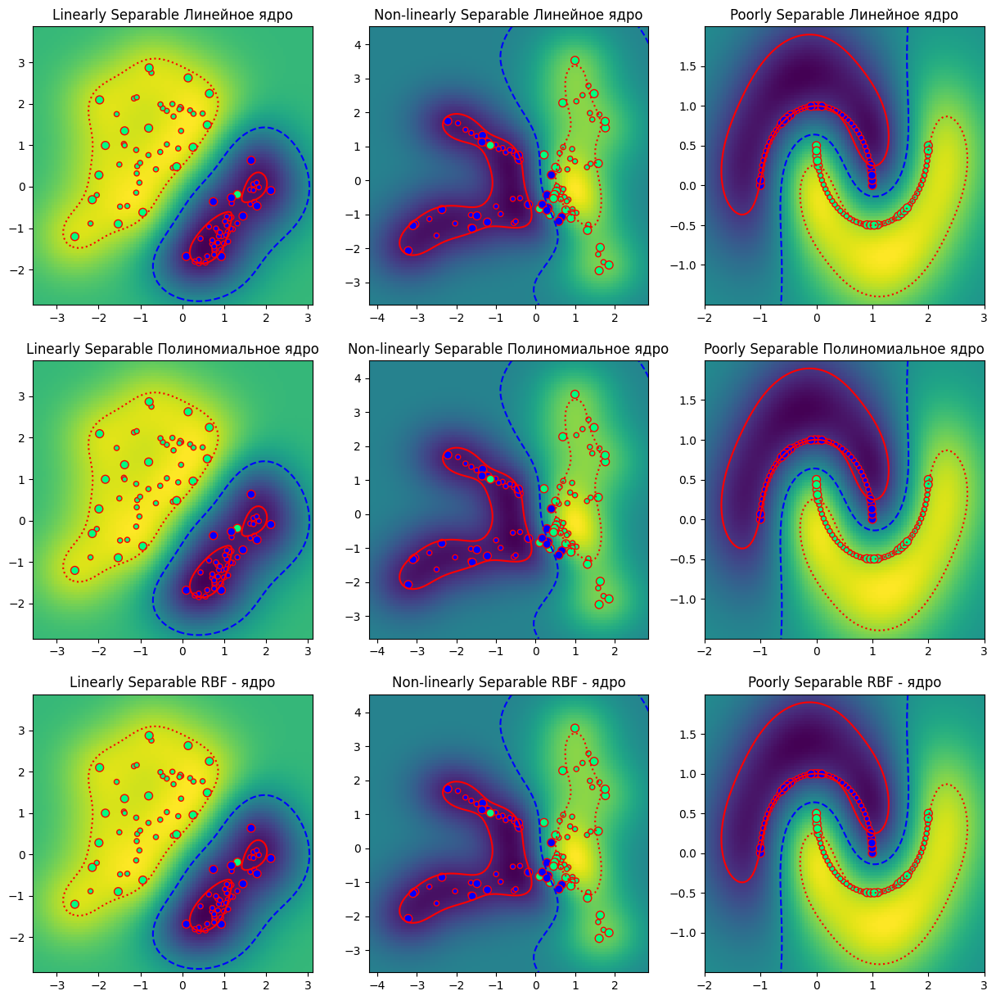

In [36]:
# Create subplots for visualization
fig, ax = plt.subplots(3, 3, figsize=(15, 15))

# Define kernel types
kernels = ['Линейное', 'Полиномиальное', 'RBF -']

# Loop through the datasets (i) and kernel types (j)
for i in range(3):
    for j in range(3):
        # Call the visualize_DualSVM function to visualize SVM models with different kernels
        visualize_DualSVM(X[i], y[i], i, j, kernel=kernels[j], power=2, gamma=1)
        
        # Set the subplot title with dataset name and kernel type
        ax[j][i].set_title(titles[i] + ' ' + kernels[j] + ' ядро')

# Display the subplots
plt.show()

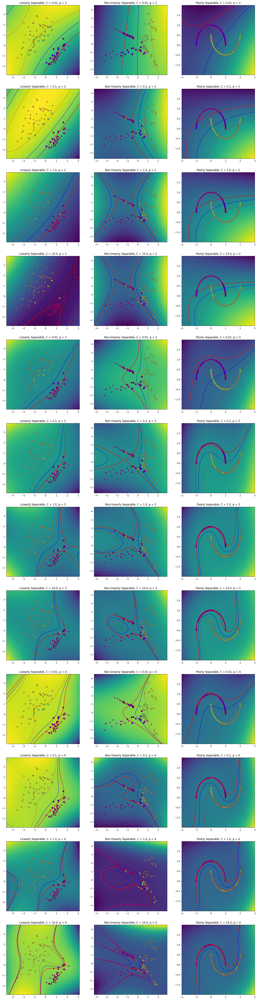

In [41]:
# Define an array of powers (degrees)
powers = np.arange(2, 5)

# Create a grid of C and power values
cvals, pvals = np.meshgrid(C, powers)
pp = pvals.flatten()
cc = cvals.flatten()

# Create subplots for visualization
fig, ax = plt.subplots(len(pp), 3, figsize=(20, 80))

# Loop through the datasets (i), powers (j), and combinations of C and power values
for i in range(3):
    for j in range(len(pp)):
        # Call the visualize_DualSVM function to visualize SVM models with polynomial kernel
        visualize_DualSVM(X[i], y[i], i, j, cc[j], 'poly', pp[j])
        
        # Set the subplot title with dataset name, C value, and power value
        ax[j][i].set_title(titles[i] + ', C = ' + str(cc[j]) + ', p = ' + str(pp[j]))

# Display the subplots
plt.show()

Вывод: На представленных выше графиках мы исследовали ядерную машину опорных векторов (SVM) с использованием полиномиального ядра. Исходя из полученных результатов, можно сделать вывод, что увеличение степени полинома положительно влияет на качество построения границ между классами (особенно это заметно на выборке с плохо разделимыми классами). С другой стороны, параметр C влияет на ширину разделяющей полосы.

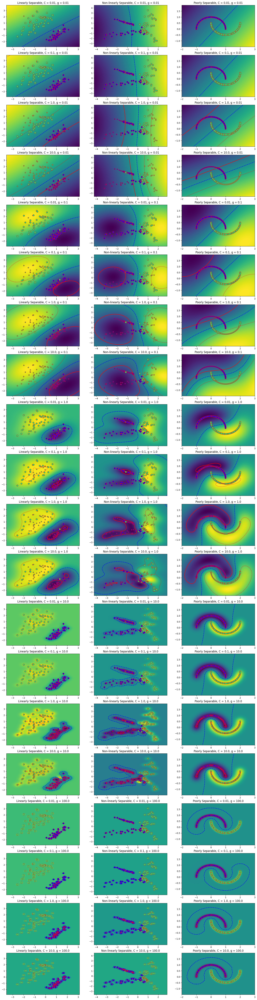

In [40]:
# Определение значений параметра gamma
gammas = 10. ** np.arange(-2, 3)

# Создание сетки значений C и gamma
cvals, gvals = np.meshgrid(C, gammas)
gg = gvals.flatten()
cc = cvals.flatten()

# Создание подграфиков для визуализации
fig, ax = plt.subplots(len(gg), 3, figsize=(20, 80))

# Цикл по наборам данных (i), значениям gamma (j) и комбинациям C и gamma
for i in range(3):
    for j in range(len(gg)):
        # Вызов функции visualize_DualSVM для визуализации моделей SVM с ядром RBF
        visualize_DualSVM(X[i], y[i], i, j, cc[j], 'RBF', gamma=gg[j])
        
        # Задание заголовка подграфика с указанием имени набора данных, значения C и gamma
        ax[j][i].set_title(titles[i] + ', C = ' + str(cc[j]) + ', g = ' + str(gg[j]))

# Отображение подграфиков
plt.show()

ВЫВОД: На графиках, представленных выше, мы рассмотрели SVM с RBF-ядром. Из полученных результатов можно сделать вывод, что слишком низкое значение параметра C приводит к грубой модели, а слишком высокое значение (g, гамма) - к переобучению.

Матрицы задач квадратичного программирования как правило разрежены, лучше использовать матричные операции над разреженными матрицами при реализации SVM.
[Разреженные и плотные матрицы](http://abel.ee.ucla.edu/cvxopt/userguide/matrices.html)